<h2>Visualize the Results of the Kelp Species Machine Learning Model</h2>

<h4><strong>Data Used</strong></h4>
<ul>
    <li>Machine Learning Model Results</li><br>

| Dataset | Description |
|:--------------------:|:-----------------------:|
| model_results.csv | CSV prediction file created in the Macroalgae Machine Learning notebook, <br> attributing each pixel in the ROI with "presence" or "absence" of kelp species |
</ul>

<h4><strong>Learning Outcomes</strong></h4>

At the end of this notebook you will be able to:
* Create spatial data from a machine learning predictions CSV file and rasterize the data to the desired resolution.
* Visualize model results using different plotting methods.

## <a id='TOC_TOP'></a>Contents

</div>
    
 1. [Macroalgae Machine Learning Prediction Dataset](#section1)
 1. [Dataset Visualizations](#section2)

<hr>

<div class="alert alert-block alert-warning"> 
  
#### Prerequisites:
 1. __*Wekeo account*__: Create an account via "Register" here: https://wekeo.copernicus.eu/
 2. __*Copernicus Marine*__ account: Create an account here: https://data.marine.copernicus.eu/register
 3. __*Five external libraries*__ must be installed in the wekeolab python environment. <br>
    -  open a *terminal* in the wekeolab JupyterHub environment
    -  activate the wekeolab environment <code style="background:red;color:white">conda activate wekeolab</code>
    -  execute the following commands to install the required packages in the wekeolab environment:
        -  <code style="background:red;color:white">conda install -c conda-forge xcube-cmems bottleneck openeo xgboost optuna hvplot geoviews -y</code> 


</div>

We start by importing all libraries that will be used in this notebook.

In [14]:
import pyproj
print(pyproj.datadir.get_data_dir())

# File handling and data science
import os
import numpy as np
import xarray as xr
import rioxarray
import pandas as pd
import scipy
from scipy.interpolate import griddata
from scipy.interpolate import RegularGridInterpolator

# Geospatial data management
from osgeo import gdal
import shapely
import geopandas as gpd
import cartopy.crs as ccrs          
from shapely.geometry import Point
import xyzservices.providers as xyz

# Visualisations
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
from matplotlib.patches import Patch
import contextily as ctx
import hvplot.xarray
import geoviews

# Other
from IPython.display import JSON
import warnings
warnings.filterwarnings('ignore')

/home/jovyan/DTO_conda/share/proj


<div class="alert alert-info" role="alert">
  
## 1.  Macroalgae Machine Learning Prediction Dataset


</div>

The first thing we need to do is to read in the prediction CSV generated in the previous modeling notebook "Macroalgae_ML_modeling_01."

In [15]:
kelp_pred = os.path.join('results', 'model_results.csv')
kelp = pd.read_csv(kelp_pred, sep=',')

kelp = kelp.drop(columns=['Unnamed: 0', 'sst_missing'])
kelp.head()

,latitude,longitude,sst_c,wave_exposure,bathymetry,Zeu_depth,predictions
0,58.998953,10.700331,-1.0,13.815674,-387.505425,22.181664,0
1,58.998953,10.701911,-1.0,13.815674,-374.314975,22.200034,0
2,58.998953,10.703491,-1.0,13.815674,-350.687395,22.227680,0
3,58.998953,10.705071,-1.0,13.815674,-320.837032,22.292182,0
4,58.998953,10.706651,-1.0,13.815674,-279.195587,22.332983,0


In the next step we will make sure that we only retain prediction pixels in offshore waters.

In [16]:
kelp_all = kelp[kelp['bathymetry'] < 0]
kelp_all.head()

,latitude,longitude,sst_c,wave_exposure,bathymetry,Zeu_depth,predictions
0,58.998953,10.700331,-1.0,13.815674,-387.505425,22.181664,0
1,58.998953,10.701911,-1.0,13.815674,-374.314975,22.200034,0
2,58.998953,10.703491,-1.0,13.815674,-350.687395,22.227680,0
3,58.998953,10.705071,-1.0,13.815674,-320.837032,22.292182,0
4,58.998953,10.706651,-1.0,13.815674,-279.195587,22.332983,0


Now we limit the dataset to the pixels predicted as "presence" of kelp species in the Random Forest Classification model.

In [17]:
kelp_pres = kelp_all[kelp_all['predictions'] == 1]
kelp_pres.head()

,latitude,longitude,sst_c,wave_exposure,bathymetry,Zeu_depth,predictions
50,58.998953,10.779332,-1.0,13.814507,-11.997193,21.056264,1
51,58.998953,10.780912,-1.0,13.814507,-6.356312,21.206286,1
52,58.998953,10.782492,-1.0,13.814506,-7.969474,21.169390,1
63,58.998953,10.799872,-1.0,13.814167,-11.637313,20.206682,1
80,58.998953,10.826732,-1.0,13.810727,-13.722661,18.652216,1


In the following cell we use the "latitude" and "longitude" attributes in the predictions file to convert the CSV to geospatial data and generate a spatial data array.

In [23]:
kelp_gdf_pres = gpd.GeoDataFrame(kelp_pres, geometry=gpd.points_from_xy(kelp_pres.longitude, kelp_pres.latitude, crs='EPSG:4326'))
kelp_pres_mi = kelp_pres.set_index(['latitude', 'longitude'])

kelp_pres_ds = xr.Dataset.from_dataframe(kelp_pres_mi)
kelp_pres_ds

<xarray.Dataset> Size: 37MB
Dimensions:        (latitude: 1076, longitude: 864)
Coordinates:
  * latitude       (latitude) float64 9kB 57.3 57.3 57.3 ... 59.0 59.0 59.0
  * longitude      (longitude) float64 7kB 10.7 10.7 10.7 ... 12.1 12.1 12.1
Data variables:
    sst_c          (latitude, longitude) float64 7MB nan nan nan ... nan nan nan
    wave_exposure  (latitude, longitude) float64 7MB nan nan nan ... nan nan nan
    bathymetry     (latitude, longitude) float64 7MB nan nan nan ... nan nan nan
    Zeu_depth      (latitude, longitude) float64 7MB nan nan nan ... nan nan nan
    predictions    (latitude, longitude) float64 7MB nan nan nan ... nan nan nan

<div class="alert alert-info" role="alert">
  
## 2.  Dataset Visualizations


</div>

We are now ready to visualize the entire prediction dataset along Sweden's west coast.

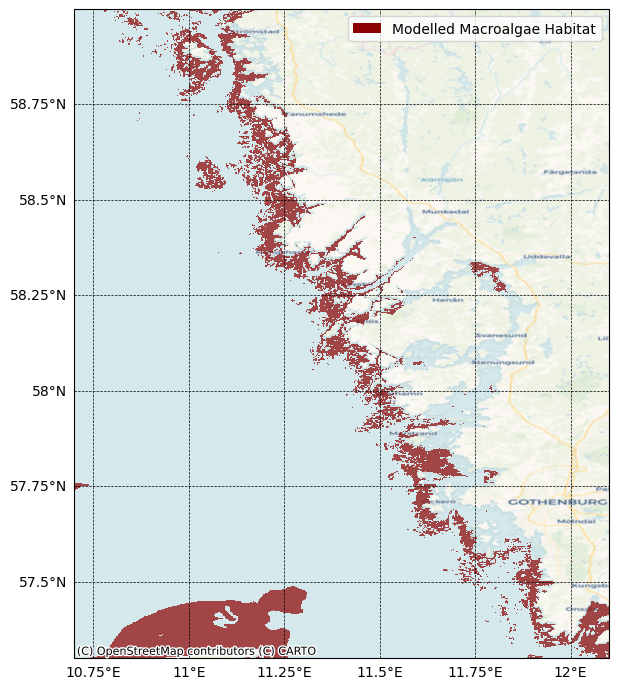

In [8]:
legend_items = [Patch(facecolor='darkred', edgecolor=None, label='Modelled Macroalgae Habitat')]
color='darkred'

fig, ax = plt.subplots(1,1,figsize=(7,7),subplot_kw=dict(projection=ccrs.PlateCarree()))

kelp_pres_ds.predictions.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    zorder=2,
    levels=[0,2],
    colors=color,
    alpha=0.7,
    add_colorbar=False
)

ctx.add_basemap(ax, crs=kelp_gdf_pres.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

g1 = ax.gridlines(draw_labels=True, zorder=2, color='0.0', linestyle='--',linewidth=0.5)
g1.top_labels = False
g1.right_labels = False
g1.xlocator = mticker.FixedLocator(np.arange(10, 14, 0.25))
g1.ylocator = mticker.FixedLocator(np.arange(55, 60, 0.25))

ax.margins(x=11.5, y=58.25)
ax.legend(handles=legend_items, loc='upper right')

plt.tight_layout()

The above dataset does not show a great level of detail, so the following 2 cells demonstrate how the user can create a zoomed in map by editing the minimum and maximum latitude and longitude variables.

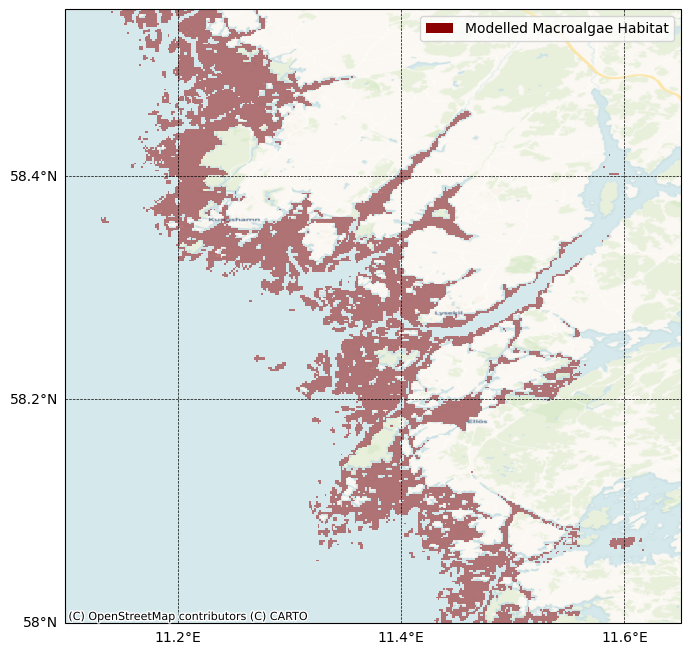

In [9]:
min_lon=11.1
min_lat=58.
max_lon=11.65
max_lat=58.55

pres_clip1 = kelp_pres_ds.sel(latitude=slice(min_lat,max_lat), longitude=slice(min_lon,max_lon))

legend_items = [Patch(facecolor='darkred', edgecolor=None, label='Modelled Macroalgae Habitat')]
color='darkred'

fig, ax = plt.subplots(1,1,figsize=(7,7),subplot_kw=dict(projection=ccrs.PlateCarree()))

pres_clip1.predictions.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    zorder=2,
    levels=[0,2],
    colors=color,
    alpha=0.5,
    add_colorbar=False
)

ctx.add_basemap(ax, crs=kelp_gdf_pres.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

g1 = ax.gridlines(draw_labels=True, zorder=2, color='0.0', linestyle='--',linewidth=0.5)
g1.top_labels = False
g1.right_labels = False
g1.xlocator = mticker.FixedLocator(np.arange(10, 14, 0.2))
g1.ylocator = mticker.FixedLocator(np.arange(55, 60, 0.2))

ax.legend(handles=legend_items, loc='upper right')

plt.tight_layout()

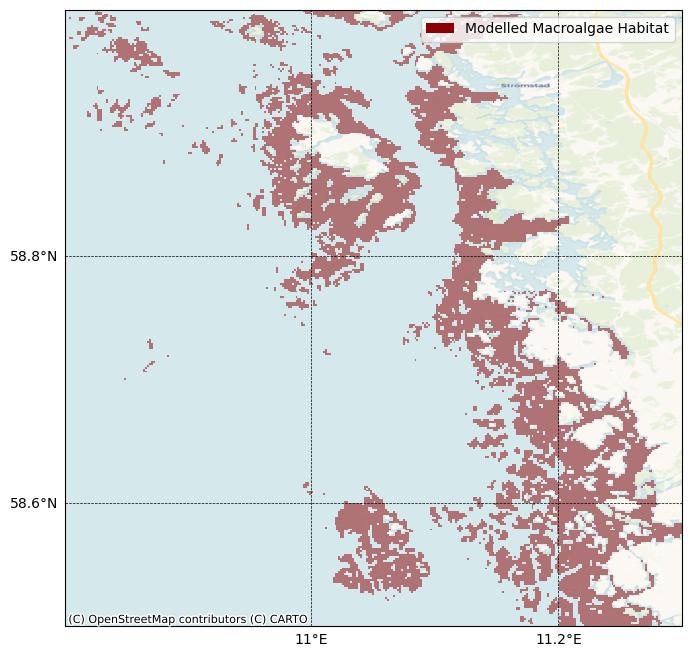

In [10]:
min_lon=10.8
min_lat=58.5
max_lon=11.3
max_lat=59.

pres_clip2 = kelp_pres_ds.sel(latitude=slice(min_lat,max_lat), longitude=slice(min_lon,max_lon))

legend_items = [Patch(facecolor='darkred', edgecolor=None, label='Modelled Macroalgae Habitat')]
color='darkred'

fig, ax = plt.subplots(1,1,figsize=(7,7),subplot_kw=dict(projection=ccrs.PlateCarree()))

pres_clip2.predictions.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    zorder=2,
    levels=[0,2],
    colors=color,
    alpha=0.5,
    add_colorbar=False
)

ctx.add_basemap(ax, crs=kelp_gdf_pres.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

g1 = ax.gridlines(draw_labels=True, zorder=2, color='0.0', linestyle='--',linewidth=0.5)
g1.top_labels = False
g1.right_labels = False
g1.xlocator = mticker.FixedLocator(np.arange(10, 14, 0.2))
g1.ylocator = mticker.FixedLocator(np.arange(55, 60, 0.2))

ax.legend(handles=legend_items, loc='upper right')

plt.tight_layout()

The following cell shows how the user can create an interactive map using the "hvplot" python package, allowing for the user to zoom in on an area of interest.

In [11]:
kelp_pres_ds['predictions'].hvplot.quadmesh(
    x='longitude',
    y='latitude',
    crs='EPSG:4326',
    tiles=True,
    tiles_opts={'alpha': 0.8}, 
    cmap='flag',
    alpha=0.5,
    colorbar=False, 
    title="Presence/Absence of kelp species", 
    label='Modelled Macroalgae Habitat',
    legend=True,
    width=1000,
    height=1000)

:Overlay
   .WMTS.I                               :WMTS   [Longitude,Latitude]
   .QuadMesh.Modelled_Macroalgae_Habitat :QuadMesh   [longitude,latitude]   (predictions)